This tutorial showcases how to generate many wavescapes in one figure, and how to create "visual" legend for the wavescapes. As it is the third notebook in a series of four, we recommand you to follow the first one "1. Single Wavescape" before dwelving into this one, as functions and parameters presented previously are used here without much explanations. Knowledge from the second notebook "2. Wavescapes on audio" is not mandatory to follow this one, although we still recommand you to check it out. 

The goal of this tutorial is only to show how to use the library; for explanations of the visualization's methodology and how to interpret wavescapes, please refer to [the official publication from Musicae Scientiae (dead link as it is not yet published)](dead)

Before beginning, be sure the module "wavescapes" and all its dependencies are properly installed on your machine or virtual environnement ( `pip install wavescapes`). ( _Note for DCML users tests: step not required as long as you are running this notebook on a local clone of the repo_ ). Run the cell below to check if the module was properly installed. 

In [1]:
'''
The shell line below will be removed once the last version of the library 
is publicly available through pip. Its purpose for now is just to redirect
the source code of the repo in the same place as this notebook.
'''
!ln -s ../wavescapes wavescapes

from wavescapes import all_wavescapes, legend_decomposition

ln: wavescapes/wavescapes: File exists


All examples in this notebook are computed from the same input file, which is the _Prelude in C Major_ from J. S. Bach (BWV 846). The version used in this repository comes from this [publicly available transcription in XML format](https://musescore.com/classicman/scores/210606) and is already downloaded and ready to use in the "inputs" folder located in the same directory as this notebook. The line below checks if the file is present and loads its path in the 'bach_prelude_fp' variable which is used throughout this notebook.

In [2]:
import os

bach_prelude_fp = 'inputs/Prelude_No._1_BWV_846_in_C_Major.mxl'

if not os.path.isfile(bach_prelude_fp):
    raise Exception("'%s' does not exist."%bach_prelude_fp)

For ease of navigation, here is the table of contents with skiplinks to directly get to the different parts presented in this notebook. If it is your first time with the library, we strongly recommand you follow this notebook in sequential order, running each cell one after the other.

# Table of Contents

1. [Multiple Wavescapes](#multiple)
    1. Mandatory parameters
    2. Parameters not shared with `single_wavescape`
2. [Legends](#legend)
    1. Dict as a way to model musical structures
    2. Single coefficient legend.
    3. Other parameter


Unless a certain part of tonality from a musical piece is needed to be investigated, it is often more useful to visualize the wavescape of all coefficients simultaneously. The function `all_wavescapes` exist for this very purpose and functions in a similar way to `single_wavescape`, it takes only two mandatory argument:

* `filepath`, a string representing the path of the input file.
* `individual_width`, an integer representing the width in pixel of only one of the six wavescapes outputted. As the plot produced from this function places thee wavescapes on a grid of three columns and two row, the resulting figure is roughly three time as wide as `individual_width`, and roughly twice as tall depending on the drawing primitive chosen

All other parameters shared with `single_wavescape` share the same default value, thus this will produce the wavescapes of all coefficient on Bach's Prelude in C Major, assuming an analysis window size of one quarter note:

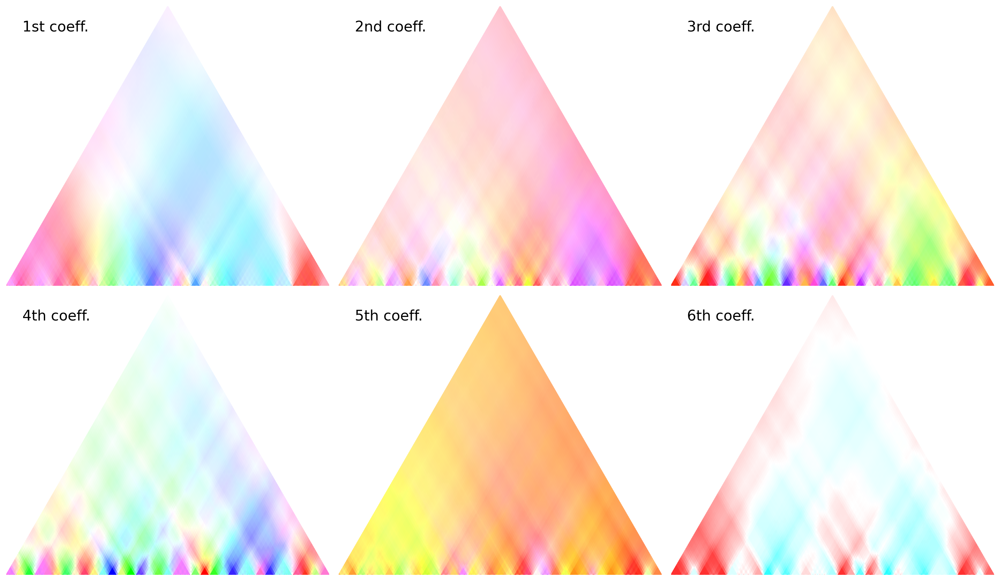

In [3]:
all_wavescapes(bach_prelude_fp, individual_width=500, aw_size=4)

The parameters works in an "all or nothing" way, meaning that, for instance, if you set `drawing_primitive` to `hexagon`, `add_line` to `.25`, an analysis window size of a bar and properly setup the tick parameters, this will be applied to all six wavescapes simultaneously:

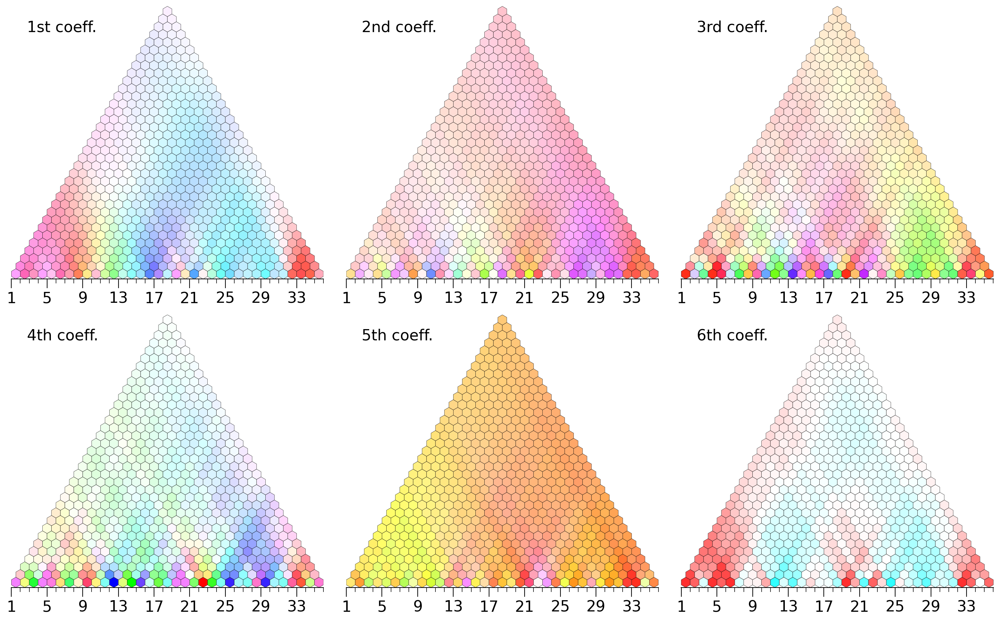

In [4]:
all_wavescapes(bach_prelude_fp, individual_width=500, aw_size=4, drawing_primitive='hexagon', add_line=.25, \
               tick_ratio = 1, tick_offset = 0)

The only parameters from `single_wavescape` that are absent from `all_wavescapes` are the following: 

* `label`: this parameter is already used internally by 'all_wavescapes' to label the coefficient on each wavescapes at the top left corner. 
* `ax`: the resulting 'all_wavescapes' plot being already figure with subplots, it is not possible to have it included in another subplot. 

Although also present in both function, `save_label` acts differently in `all_wavescapes`:
It represent the prefix of the filepath to save each individual wavescape is individual plot, instead of producing a 2 by 3 figure and saving it. This string parameter should not hold any file extensions at the end, as it is generated by this function. For example, if the value `bach` is provided to this parameter, then the following files will be created: bach1.png, bach2.png, bach3.png, bach4.png, bach5.png and bach6.png. Each number preceding the PNG extension indicates which coefficient is vizualized in the file.

If the collage of six wavescapes needs to be saved in a single plot, the function `matplotlib.pyplot.savefig(<filename>.<extension>, transparent=<True|False whether the output needs opacity>)` can be used.

## 2. Legend Function

Without knowledge of the hue function used for the color mapping, it is hard to be able to understand what the color in wavescapes represent. Especially when the C major triad has a blue hue in the fourth coefficient, but orange hue in the second for instance. 

Thus, we provide with the library a function `legend_decomposition` that can provide legend for wavescape by displaying position of musical structure on the color space used for wavescape:

/Users/cedricviaccoz/wavescapes/tutorials/wavescapes/general.py:323: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['$0$', '', '$\pi/2$', '', '$\pi$', '', '$3\pi/2$', ''])


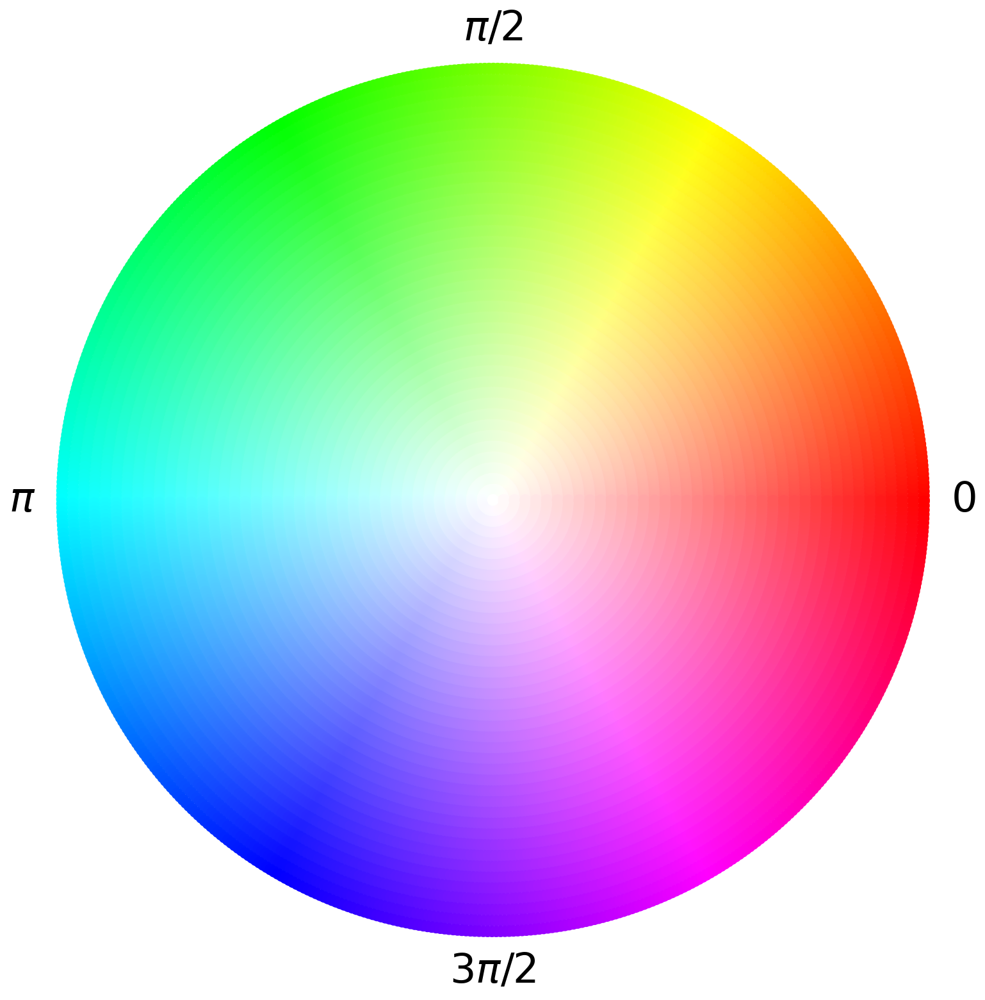

In [5]:
legend_decomposition({}, single_img_coeff=5)

This is what the color space used in wavescapes looks like if projected on a polar space, the phase and magnitudes corresponding to the polar coordinates.

It would be hard to display all musical structures existsing in a single plot, instead this function displays the placement in the color space of musical structures you want to see. This is achieved by providing to the function a dictionnary object modelising the musical structure, its label and the coefficients on which it has to be displayed. Each entry of the dictionnary has to have the following structure:

`{label: (PCV, coeffs)}`

* `PCV` being a 12 dimensional vector of float/integer values that represent the musical structure, with the first value (`PCV[0]`) representing the weight of the C pitch class, the second value (`PCV[1]`) representing the weight of the C# pitch class, and so forth until B (`PCV[11]`). For instance, A C major triad in PCV fashion is expressed as the value `[1,0,0,0,1,0,0,1,0,0,0,0]`

* `coeffs` being a variable length array collecting the number of the coefficient on which the musical structure represented by `PCV` needs to be visualised. That means if given the value `[5,6]` means we want to see the position in the color space of `PCV` for the 5th and the 6th coefficient. 


* `label` being simply the string with which to label the musical structure on the plot.

For instance, let's say we want to observe the placement in the color space of the C Major triad in the 3rd, 4th and 5th coefficient, the following dict can be provided to `legend_decomposition`


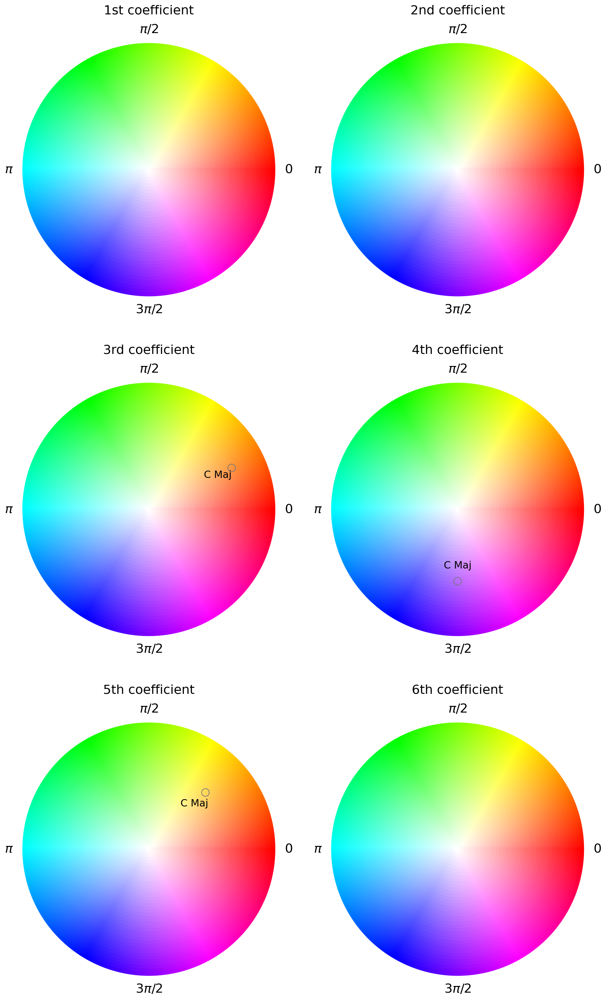

In [6]:
d = {'C Maj': ([1,0,0,0,1,0,0,1,0,0,0,0], [3,4,5])}
legend_decomposition(d)

By looking at the color isolated in the gray circle, we can see that C Major is colored purple for the 4th coefficient, while light orange for both the third and the fifth coefficient

To observe more than one musical structure at a time, more entries can be provided to the input dict. Furthermore, if you want to observe the position of a musical structure on all coefficients without the hassle of writing down each coefficient number, you can simply provide the value `[0]` for the `coeffs` part of the dict.

Let's say we want to observe the position on all coefficients of the C augmented triad, and the D minor sevent chord, but we want to observe the position of the C Major diatonic scale only on the 5th coefficient:

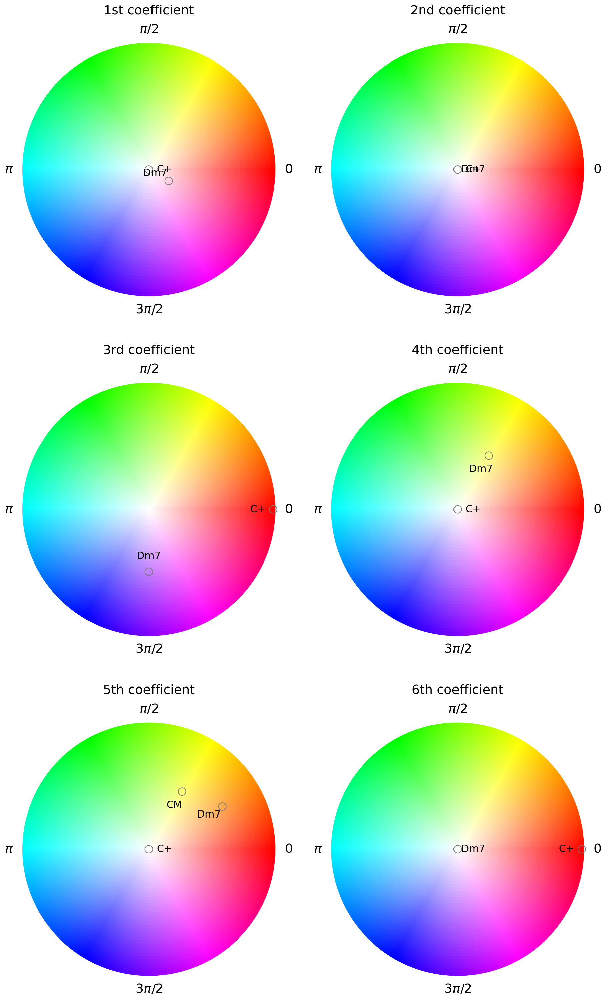

In [7]:
d = {'C+': ([1,0,0,0,1,0,0,0,1,0,0,0], [0]),
     'Dm7': ([1,0,1,0,0,1,0,0,0,1,0,0], [0]),
     'CM': ([1,0,1,0,1,1,0,1,0,1,0,1], [5]),}
legend_decomposition(d)

Let's now say we are interested by what is happening on the legend for the fifth coefficient and want to observe only that. This can be done by providing the number of the coefficient to be isolated to the parameter `single_image_coeff`:

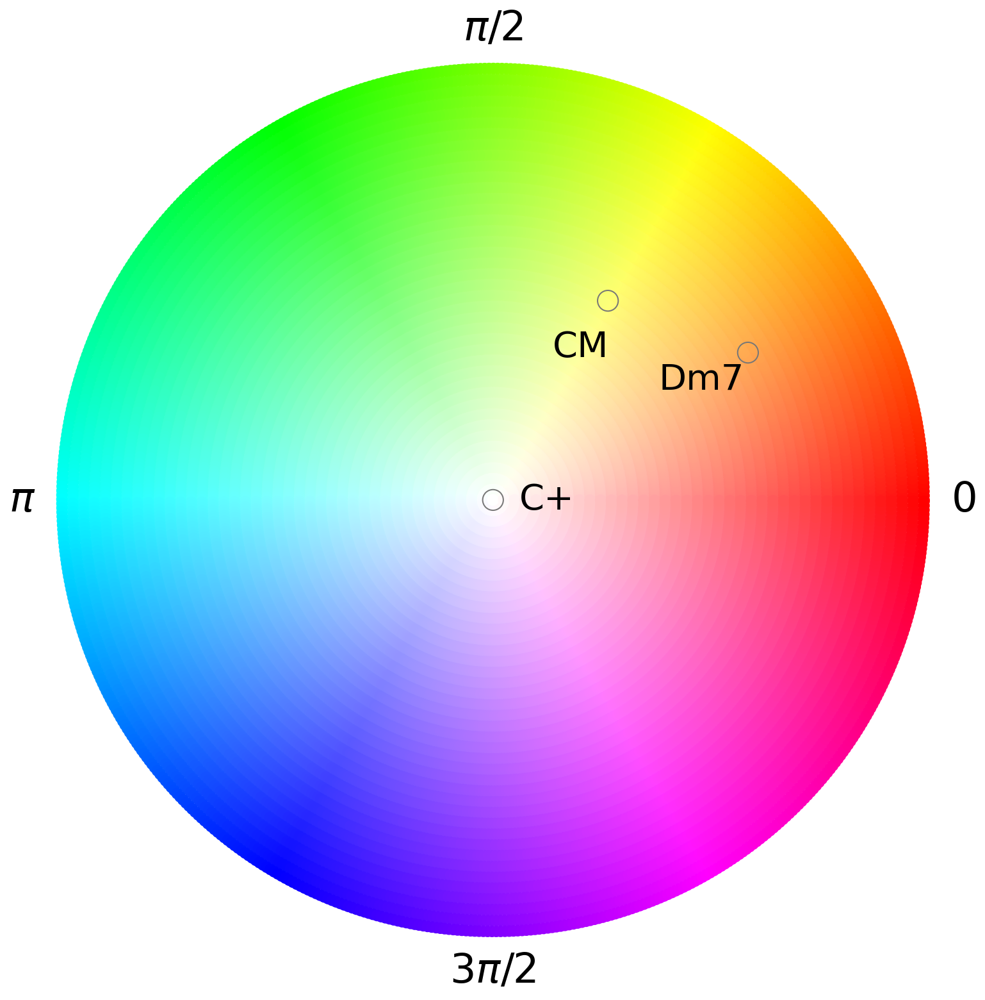

In [16]:
d = {'C+': ([1,0,0,0,1,0,0,0,1,0,0,0], [0]),
     'Dm7': ([1,0,1,0,0,1,0,0,0,1,0,0], [0]),
     'CM': ([1,0,1,0,1,1,0,1,0,1,0,1], [5]),}
legend_decomposition(d, single_img_coeff=5)

There are two remaining parameters to this function. The first one is `width`, and simply indicates the width of the figure in inches, by default it is set to 13.

The other one is `no_opacity_mapping` which is a boolean value disabling the opacity mapping of the magnitude from the color space. It is set by default to `False` (meaning by default we want the opacity mapping), and can be useful if we want to solely look at the phase component of a wavescape element:

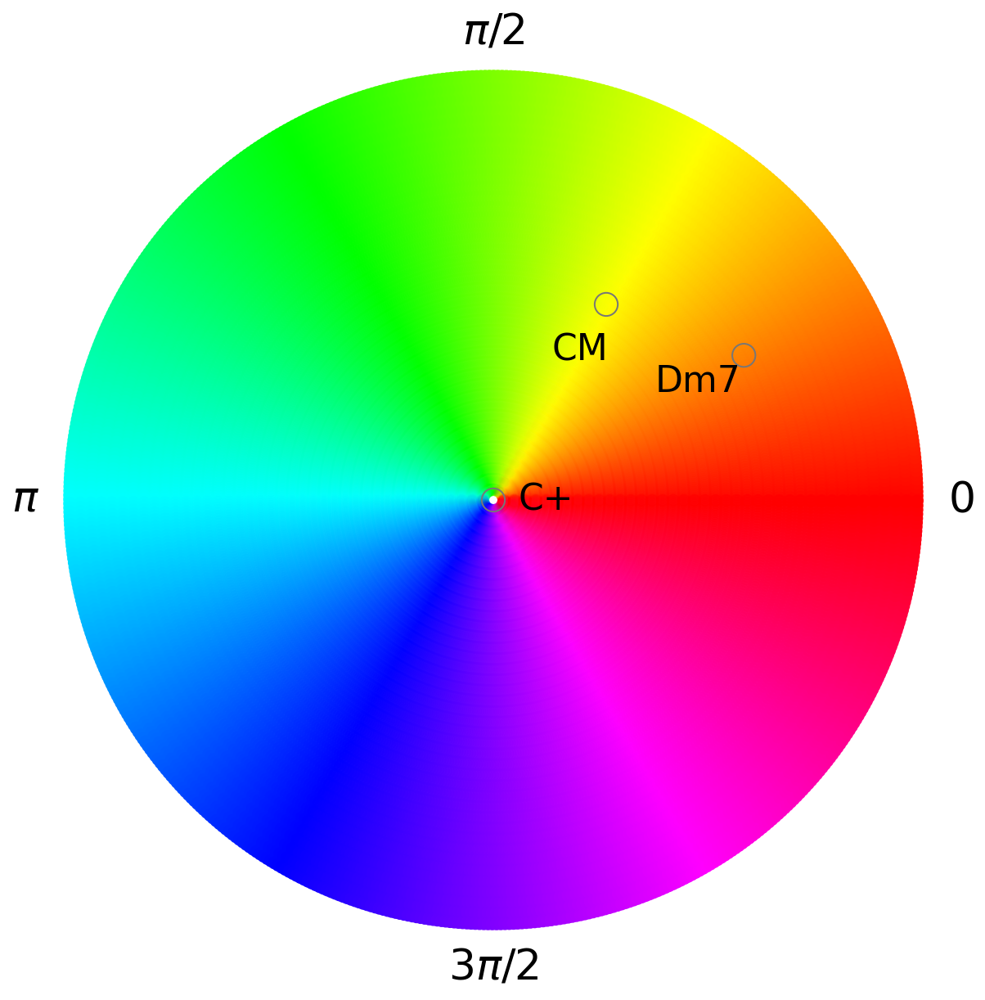

In [17]:
legend_decomposition(d, single_img_coeff=5, width=10, no_opacity_mapping=True)

Similarly, a `no_hue_mapping` exists if only the magnitude of a component needs to be observed.

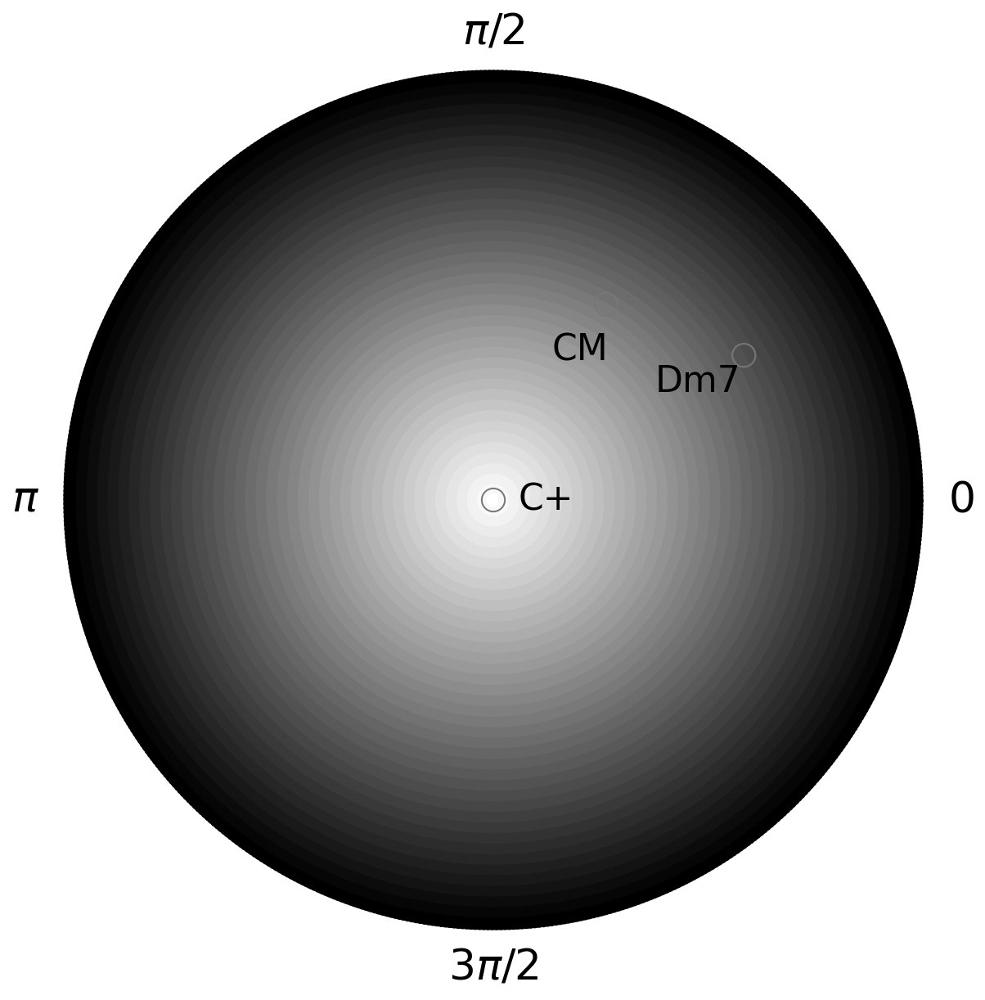

In [18]:
legend_decomposition(d, single_img_coeff=5, width=10, no_hue_mapping=True)

And you may combine both parameters together to remove both the hue and opacity, but why would you want to do that?

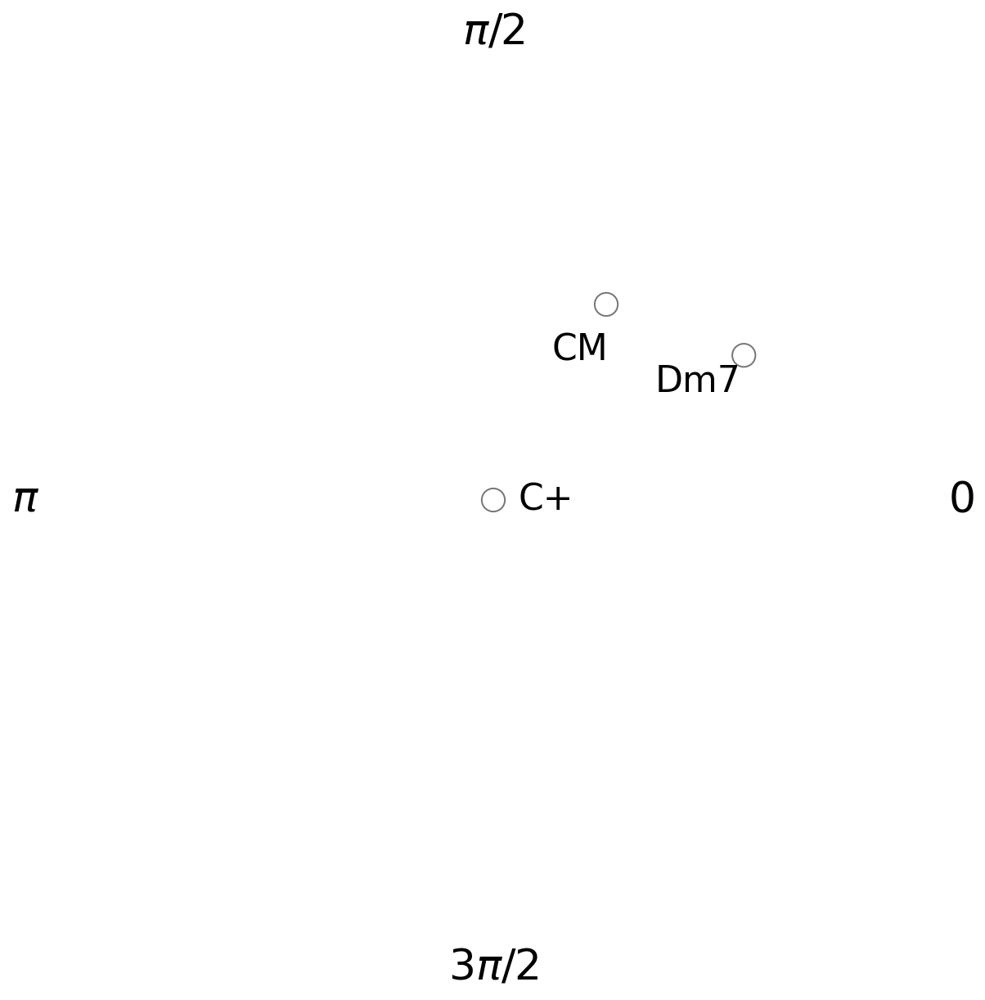

In [19]:
legend_decomposition(d, single_img_coeff=5, width=10, no_hue_mapping=True, no_opacity_mapping=True)